# CCD Artifacts Detection Routines

This notebook contains the routine to detect if CCD artifacts (e.g. streaking) exists in images

## Streaking/blooming due to bright stars

In [1]:
%config InlineBackend.figure_format='retina'

import numpy as np
import pylab as plt
import tensorflow as tf


def plot_sobel_edges(filename, threshold=2.7):
    img = plt.imread(filename)    
    img_edges = tf.image.sobel_edges(tf.convert_to_tensor(np.expand_dims(img, 0)/255))  # always 0 in last dimension due to how CCD readout direction is horizontal

    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
    ax1.imshow(img)
    ax1.axis("off")
    ax1.set_title(filename, fontsize=20)
    ax2.imshow(img_edges[0, :, :, :, 0])
    ax2.axis("off")
    ax2.set_title("Detected Edges", fontsize=20)
    ax3.imshow(np.max((img_edges[0, :, :, :, 0].numpy()>threshold).astype(int), axis=2), cmap=plt.cm.gray, vmin=0, vmax=1)
    ax3.axis("off")
    ax3.set_title(f"Total Pix Detected: {np.sum(img_edges>threshold)}", fontsize=20)
    fig.tight_layout()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


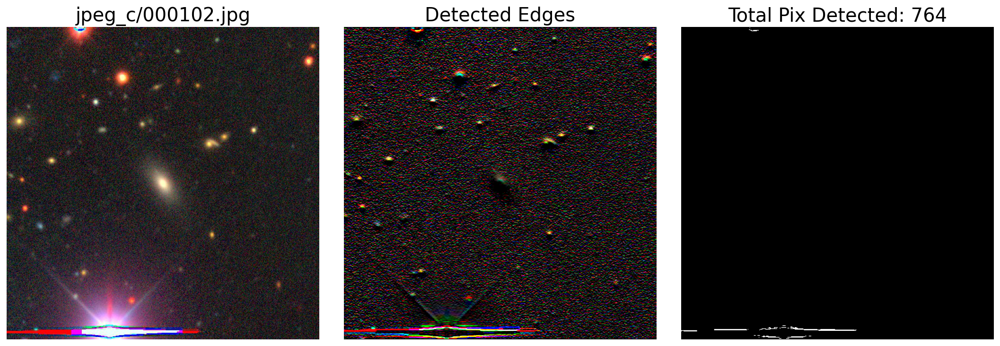

In [27]:
plot_sobel_edges("jpeg_c/000102.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


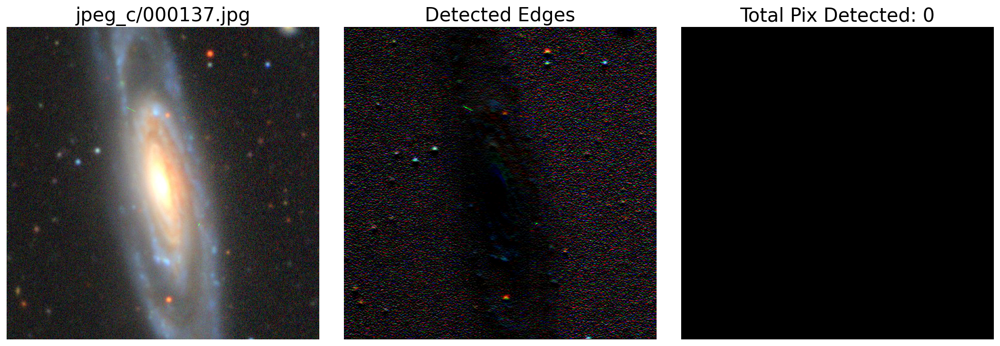

In [28]:
plot_sobel_edges("jpeg_c/000137.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


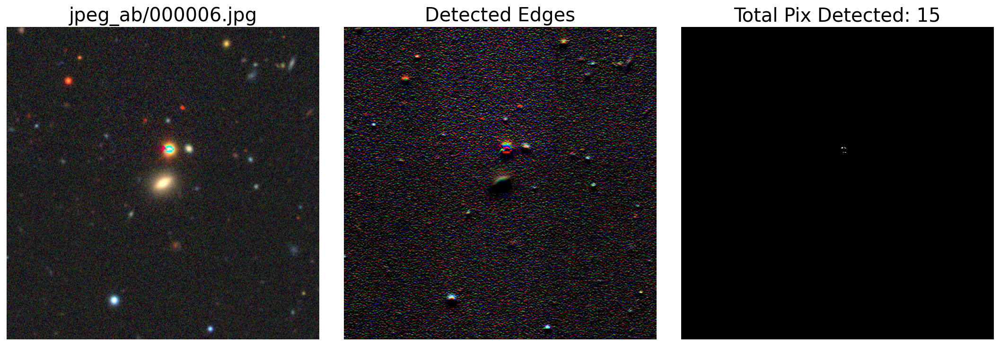

In [29]:
plot_sobel_edges("jpeg_ab/000006.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


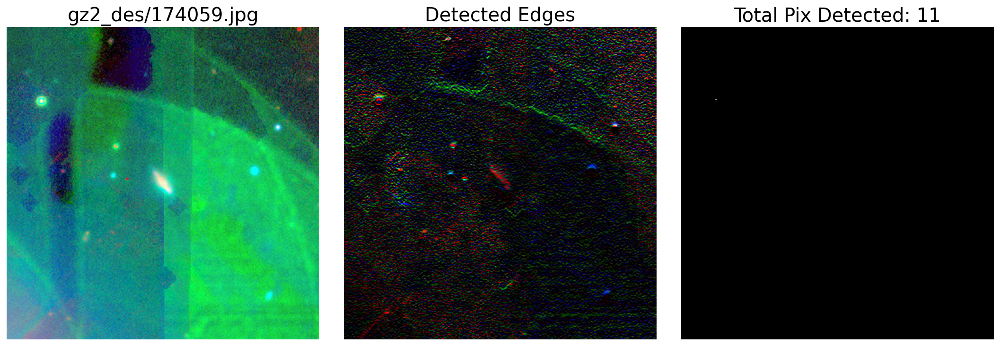

In [4]:
plot_sobel_edges("gz2_des/174059.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


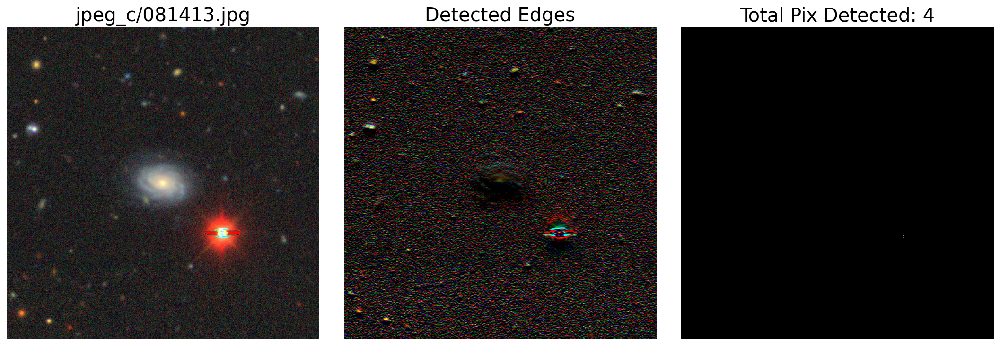

In [6]:
plot_sobel_edges("jpeg_c/081413.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


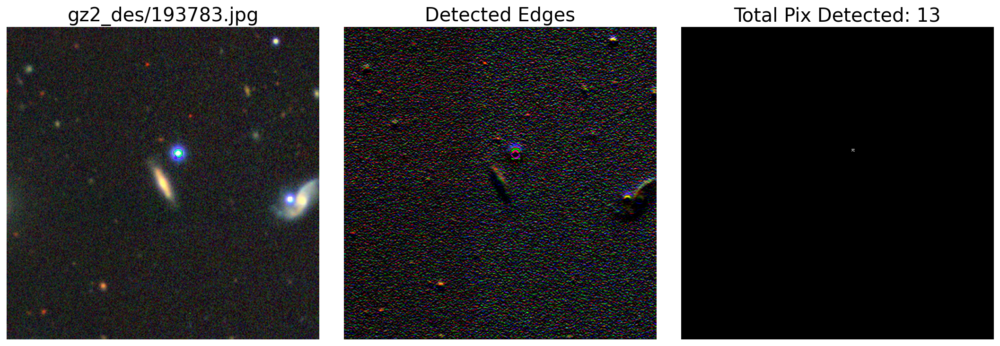

In [3]:
plot_sobel_edges("gz2_des/193783.jpg")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


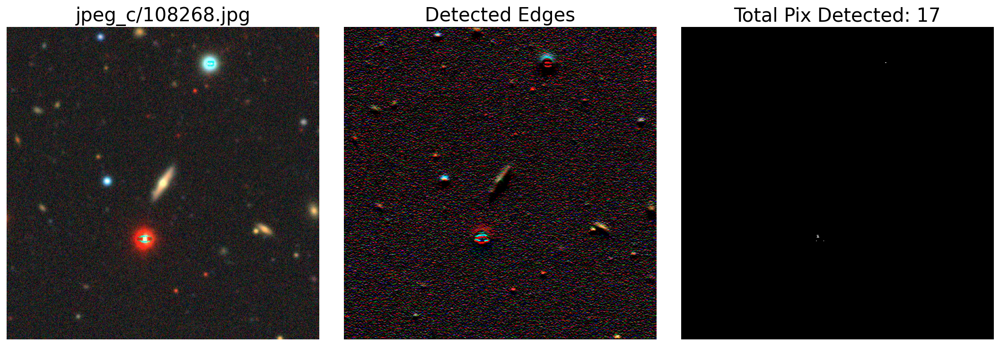

In [4]:
plot_sobel_edges("jpeg_c/108268.jpg")

## Apply edge detection to the whole dataset with Tensorflow

In [1]:
import tqdm
import numpy as np
import tensorflow as tf


class TFImgGenerator:
    """
    Using Tensorflow to quickly loop throught all galaxy images with all CPU/GPU resources
    """
    def __init__(self, folder="jpeg_ab", batch=64, size=None):
        self.folder = folder
        self.file_list = tf.io.match_filenames_once(f"./{folder}/*.jpg")
        self.num_file = self.file_list.shape[0]
        self.idx = 0
        self.batch = batch
        if size:
            self.size = np.genfromtxt(size)
        else:
            self.size = size
        
        self.dataset = tf.data.Dataset.from_tensor_slices((self.file_list))
        self.dataset = self.dataset.map(self.read_img, num_parallel_calls=tf.data.AUTOTUNE).batch(self.batch).prefetch(tf.data.AUTOTUNE)
        
        self.gray_dataset = tf.data.Dataset.from_tensor_slices((self.file_list))
        self.gray_dataset = self.gray_dataset.map(self.read_img_2gray, num_parallel_calls=tf.data.AUTOTUNE).batch(self.batch).prefetch(tf.data.AUTOTUNE)
        
        self.cropped_dataset = tf.data.Dataset.from_tensor_slices((self.file_list))
        self.cropped_dataset = self.cropped_dataset.map(self.read_img_cropped, num_parallel_calls=tf.data.AUTOTUNE).batch(self.batch).prefetch(tf.data.AUTOTUNE)
        
        self.dataset_size_estimated = tf.data.Dataset.from_tensor_slices({"filename": self.file_list, "size": self.size})
        self.dataset_size_estimated = self.dataset_size_estimated.map(self.read_img_n_cropped, num_parallel_calls=tf.data.AUTOTUNE).batch(self.batch).prefetch(tf.data.AUTOTUNE)
        
    def read_img(self, filename):
        image_string = tf.io.read_file(filename)
        image_decoded = tf.io.decode_jpeg(image_string)/255
        return image_decoded 
    
    def read_img_2gray(self, filename):
        return tf.image.rgb_to_grayscale(self.read_img(filename))
    
    def read_img_cropped(self, filename):
        image_string = tf.io.read_file(filename)
        image_decoded = tf.io.decode_jpeg(image_string)/255
        return image_decoded[128:384, 128:384, :]

    def read_img_n_cropped(self, args):
        filename, size = args["filename"], args["size"]
        image_string = tf.io.read_file(filename)
        image_decoded = tf.io.decode_jpeg(image_string)/255
        if size<17500:
            return image_decoded[128:384, 128:384, :]
        else:
            return tf.image.resize(image_decoded, (256, 256))

### No Crop

In [3]:
ds_ab = TFImgGenerator(folder="jpeg_ab", batch=128)

result_ab = np.zeros(ds_ab.num_file)
current_idx = 0

for i in tqdm.tqdm(ds_ab.dataset):
    imgs_edges = tf.image.sobel_edges(i)[:, :, :, :, 0]
    true_edges = tf.math.greater(imgs_edges, 2.7)
    tempresult = tf.math.count_nonzero(true_edges, axis=(1, 2, 3))
    current_shape = tempresult.shape[0]
    result_ab[current_idx:current_idx+current_shape] = tempresult
    current_idx+=current_shape

# Total number of images with CCD artifacts
print(len(np.where(result_ab!=0)[0]))
np.savetxt("edges_result_ab.csv", result_ab)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 727/727 [02:31<00:00,  4.79it/s]


24916


In [4]:
ds_c = TFImgGenerator(folder="jpeg_c", batch=128)

result_c = np.zeros(ds_c.num_file)
current_idx = 0

for i in tqdm.tqdm(ds_c.dataset):
    imgs_edges = tf.image.sobel_edges(i)[:, :, :, :, 0]
    true_edges = tf.math.greater(imgs_edges, 2.7)
    tempresult = tf.math.count_nonzero(true_edges, axis=(1, 2, 3))
    current_shape = tempresult.shape[0]
    result_c[current_idx:current_idx+current_shape] = tempresult
    current_idx+=current_shape
# Total number of images with CCD artifacts
print(len(np.where(result_c==0)[0]))
np.savetxt("edges_result_c.csv", result_c)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1979/1979 [08:02<00:00,  4.10it/s]


196601


In [5]:
ds_gz2 = TFImgGenerator(folder="gz2_des", batch=128)

result_gz2 = np.zeros(ds_gz2.num_file)
current_idx = 0

for i in tqdm.tqdm(ds_gz2.dataset):
    imgs_edges = tf.image.sobel_edges(i)[:, :, :, :, 0]
    true_edges = tf.math.greater(imgs_edges, 2.7)
    tempresult = tf.math.count_nonzero(true_edges, axis=(1, 2, 3))
    current_shape = tempresult.shape[0]
    result_gz2[current_idx:current_idx+current_shape] = tempresult
    current_idx+=current_shape
# Total number of images with CCD artifacts
print(len(np.where(result_gz2==0)[0]))
np.savetxt("edges_result_gz2.csv", result_gz2)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1867/1867 [05:52<00:00,  5.30it/s]


174965


### Adaptive "Crop"

In [2]:
ds_ab = TFImgGenerator(folder="jpeg_ab", batch=128, size="gsize_result_ab.csv")

result_ab = np.zeros(ds_ab.num_file)
current_idx = 0

for i in tqdm.tqdm(ds_ab.dataset_size_estimated):
    imgs_edges = tf.image.sobel_edges(i)[:, :, :, :, 0]
    true_edges = tf.math.greater(imgs_edges, 2.7)
    tempresult = tf.math.count_nonzero(true_edges, axis=(1, 2, 3))
    current_shape = tempresult.shape[0]
    result_ab[current_idx:current_idx+current_shape] = tempresult
    current_idx+=current_shape

# Total number of images with CCD artifacts
print(len(np.where(result_ab!=0)[0]))
np.savetxt("edges_result_ab_cropped.csv", result_ab)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 727/727 [02:05<00:00,  5.78it/s]


6790


In [4]:
ds_c = TFImgGenerator(folder="jpeg_c", batch=128, size="gsize_result_c.csv")

result_c = np.zeros(ds_c.num_file)
current_idx = 0

for i in tqdm.tqdm(ds_c.dataset_size_estimated):
    imgs_edges = tf.image.sobel_edges(i)[:, :, :, :, 0]
    true_edges = tf.math.greater(imgs_edges, 2.7)
    tempresult = tf.math.count_nonzero(true_edges, axis=(1, 2, 3))
    current_shape = tempresult.shape[0]
    result_c[current_idx:current_idx+current_shape] = tempresult
    current_idx+=current_shape

# Total number of images with CCD artifacts
print(len(np.where(result_c!=0)[0]))
np.savetxt("edges_result_c_cropped.csv", result_c)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1979/1979 [06:42<00:00,  4.92it/s]

15141


In [7]:
ds_sdss = TFImgGenerator(folder="gz2_des", batch=128, size="gsize_result_gz2.csv")

result_sdss = np.zeros(ds_sdss.num_file)
current_idx = 0

for i in tqdm.tqdm(ds_sdss.dataset_size_estimated):
    imgs_edges = tf.image.sobel_edges(i)[:, :, :, :, 0]
    true_edges = tf.math.greater(imgs_edges, 2.7)
    tempresult = tf.math.count_nonzero(true_edges, axis=(1, 2, 3))
    current_shape = tempresult.shape[0]
    result_sdss[current_idx:current_idx+current_shape] = tempresult
    current_idx+=current_shape

# Total number of images with CCD artifacts
print(len(np.where(result_sdss!=0)[0]))
np.savetxt("edges_result_gz2_cropped.csv", result_sdss)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1867/1867 [05:44<00:00,  5.42it/s]


20687
